In [2]:
import os
import numpy as np
import pandas as pd
import plotly.express as px
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
map_file = "gz_2010_us_040_00_5m.json" #source : https://eric.clst.org/tech/usgeojson/, I used US states 5m

### Data Visualization

In [4]:
external_data = pd.read_csv("./data/2_clean/external_data.csv")
sample = external_data.sample(n=int(1e5))
fires = pd.read_csv("./data/3_merge/merged_data_haversine.csv")

c:\Users\fbettini\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3258: DtypeWarning: Columns (1,17) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [18]:
# TODO se baser sur les fichiers contenus dans './data/3_merge/xxx'
# TODO à mettre dans un pipeline.py ou utils.py

def animate_map(col:str, time_col:str, df:pd.DataFrame)->None:
    '''
    Animate a map over time of a numerical feature from the dataframe
    
    Input:
    df (pd.DataFrame) : Input data with Lat, Lon
    col (str) : Name of the column from the dataframe to be used for plot
    time_col (str) : Name of the column representing timestamps to be used (Years is best)
    
    Output:
    None : it just shows the graph
    '''
    fig = px.scatter_mapbox(df,
              lat="Lat" ,
              lon="Lon",
              hover_name=col,
              color=col,
              animation_frame=time_col,
              mapbox_style='carto-positron',
              category_orders={
              time_col:list(np.sort(df[time_col].unique()))
              },                  
              zoom=2,
              range_color=[0,120])
    fig.show();

def plot_map(df:pd.DataFrame, col:str, map_file:str)->None:
    '''
    Plot a static map of a categorical feature from the dataframe
    
    Input:
    df (pd.DataFrame) : Input data with Lat, Lon
    col (str) : Column from the dataframe to be used for plot
    map_file (str) : path to the map file to be used as background.
    
    Output:
    None : it just shows the graph
    '''
    
    states_geojson = gpd.read_file(map_file)
    fig, ax = plt.subplots(figsize = (10,8))
    states_geojson.boundary.plot(ax = ax, edgecolor = 'black')
    sns.scatterplot(df['Lon'], df['Lat'], marker = 'o', 
                    hue = df[col], ax = ax)

    # move the legend to the right of the plot
    ax.legend(loc = 'center right', bbox_to_anchor=(1.7, 0.5), ncol=1) 
    minx, miny, maxx, maxy = array
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.axis('off')
    plt.show()

In [ ]:
# show 
fires['STAT_CAUSE_DESCR'].value_counts(ascending=True).plot(kind='barh',color='coral',title='causes of fires')
plt.show()

In [19]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
NA = world[world.continent=="North America"]
USA = NA[NA.iso_a3 =="USA"]

In [20]:
USA.total_bounds
# Rework the boundaries to remove Alaska and have a clearer view of the main part of the USA
array = np.array([-130,22,-66,60])

/Users/yberthel/Documents/Air quality/air_quality/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


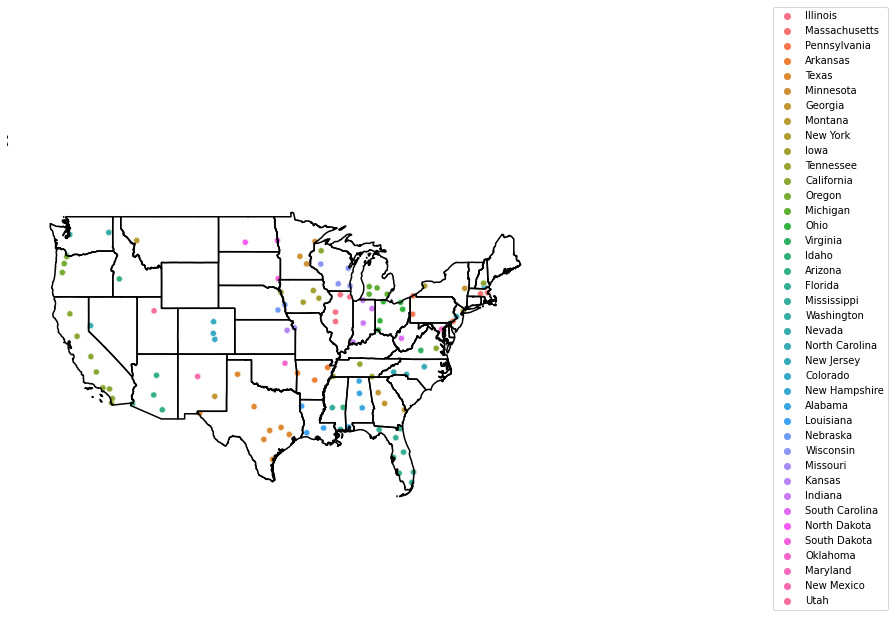

In [21]:
plot_map(sample, col="State", map_file=map_file)

### Animated plot

In [57]:
sample["year"] = sample.Date.apply(lambda x : x.year)
animate_map(col=,time_col='year', df=sample)

### Random plots

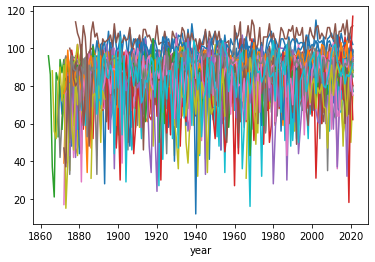

In [88]:
fig, ax = plt.subplots()
for state in sample.State.unique():
    if isinstance(state, str):
        sample.groupby(['State','year']).tmax.max()[state].plot(ax=ax)

<AxesSubplot:xlabel='year'>

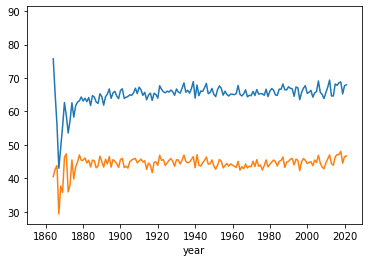

In [94]:
fig,ax = plt.subplots()
sample.groupby("year").tmax.mean().plot(ax=ax)
sample.groupby("year").tmin.mean().plot(ax=ax)


<AxesSubplot:xlabel='year'>

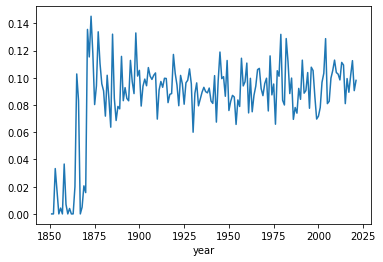

In [95]:
fig,ax = plt.subplots()
sample.groupby("year").prcp.mean().plot(ax=ax)

#### Fires' causes distribution

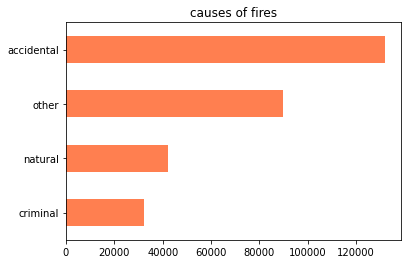

In [5]:
fires['CAUSE_DESCR'].value_counts(ascending=True).plot(kind='barh',color='coral',title='causes of fires')
plt.show()